In [1]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import os

In [2]:
# Folder path
folder_path = "/Users/anna/Desktop/XCT/SlicesCropped/4A-85-crop/"

# Filenames
image_files = ["4A-150-85kv.png","4A-200-85kv.png","4A-250-85kv.png","4A-300-85kv.png","4A-350-85kv.png","4A-400-85kv.png",
               "4A-450-85kv.png","4A-500-85kv.png","4A-550-85kv.png","4A-600-85kv.png","4A-650-85kv.png","4A-700-85kv.png","4A-750-85kv.png",
               "4A-800-85kv.png","4A-850-85kv.png","4A-900-85kv.png","4A-950-85kv.png","4A-1000-85kv.png","4A-1050-85kv.png","4A-1100-85kv.png"]

#Carbonate
lower_threshold = 81
upper_threshold = 82

# Create a figure for the images and overlays
plt.figure(figsize=(12, 9 * len(image_files)))

# Loop through each image file
for i, image_file in enumerate(image_files):
    # Full path to the image
    image_path = os.path.join(folder_path, image_file)
    
    # Load the image and convert to grayscale
    ct_image = Image.open(image_path).convert("L")
    
    # Convert the image to a NumPy array
    ct_array = np.array(ct_image)
    
    # Create a mask for the segmented region
    segmented_mask = (ct_array >= lower_threshold) & (ct_array <= upper_threshold)
    
    # Create a color overlay with transparency
    overlay = np.zeros((*ct_array.shape, 3), dtype=np.uint8)  # Create an RGB image
    overlay[..., 0] = 255  # Red channel for the overlay
    overlay[~segmented_mask] = 0  # Set non-segmented areas to black
    
    # Combine original image and overlay using alpha blending
    alpha = 0.5  # Transparency level (0 = fully transparent, 1 = fully opaque)
    overlayed_image = np.dstack([ct_array] * 3)  # Convert grayscale to RGB
    overlayed_image = overlayed_image * (1 - alpha) + overlay * alpha
    
    # Plot the original, segmented, and overlayed images
    plt.subplot(len(image_files), 3, 3 * i + 1)
    plt.imshow(ct_array, cmap="gray")
    plt.title(f"Original CT Scan Image: {image_file}")
    plt.axis("off")
    
    plt.subplot(len(image_files), 3, 3 * i + 2)
    plt.imshow(segmented_mask, cmap="gray")
    plt.title(f"Segmented Mask ({lower_threshold}-{upper_threshold} Intensity)")
    plt.axis("off")
    
    plt.subplot(len(image_files), 3, 3 * i + 3)
    plt.imshow(overlayed_image.astype(np.uint8))
    plt.title(f"Overlayed Image")
    plt.axis("off")

plt.tight_layout()
#plt.savefig('1A-85-350-segmented(40-41).png')
#plt.show()

FileNotFoundError: [Errno 2] No such file or directory: '/Users/anna/Desktop/XCT/SlicesCropped/4A-85-crop/4A-150-85kv.png'

<Figure size 1200x18000 with 0 Axes>

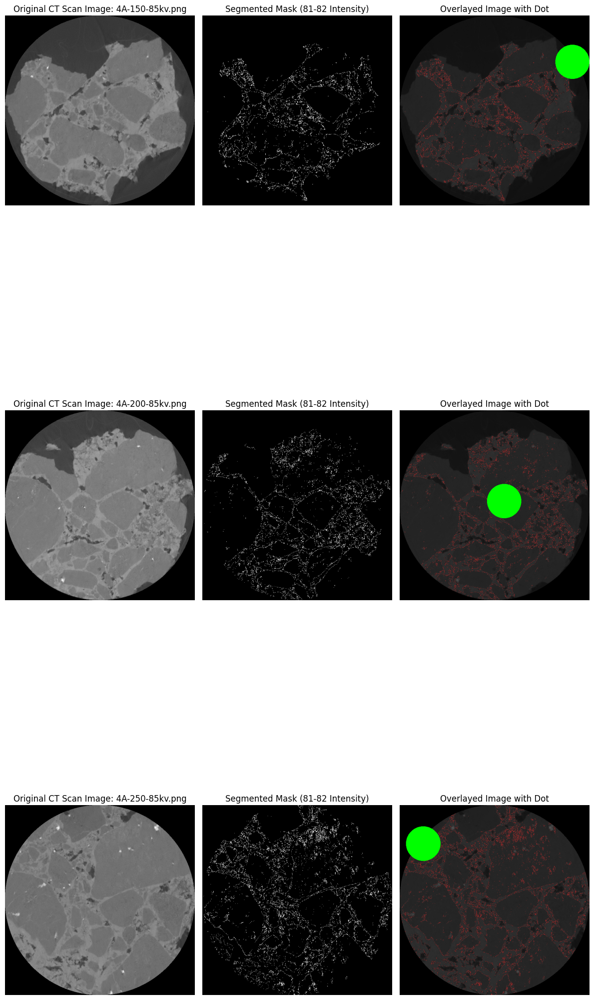

In [4]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
# Folder path
folder_path = "/Users/anna/Desktop/XCT/SlicesCropped/4A-85-crop/"

# Filenames
image_files = ["4A-150-85kv.png", "4A-200-85kv.png", "4A-250-85kv.png"]

# Carbonate thresholds
lower_threshold = 81
upper_threshold = 82

# Create a figure for the images and overlays
plt.figure(figsize=(12, 9 * len(image_files)))

# Loop through each image file
for i, image_file in enumerate(image_files):
    # Full path to the image
    image_path = os.path.join(folder_path, image_file)
    
    # Load the image and convert to grayscale
    ct_image = Image.open(image_path).convert("L")
    
    # Convert the image to a NumPy array
    ct_array = np.array(ct_image)
    height, width = ct_array.shape
    
    # Calculate dot radius (2.59% of the total image area)
    dot_area = 0.0259 * (width * height)
    dot_radius = int(np.sqrt(dot_area / np.pi))
    
    # Randomly select a position for the dot
    center_x = np.random.randint(dot_radius, width - dot_radius)
    center_y = np.random.randint(dot_radius, height - dot_radius)
    
    # Create a mask for the segmented region
    segmented_mask = (ct_array >= lower_threshold) & (ct_array <= upper_threshold)
    
    # Create a color overlay with transparency
    overlay = np.zeros((*ct_array.shape, 3), dtype=np.uint8)  # Create an RGB image
    overlay[..., 0] = 255  # Red channel for the overlay
    overlay[~segmented_mask] = 0  # Set non-segmented areas to black
    
    # Combine original image and overlay using alpha blending
    alpha = 0.5  # Transparency level (0 = fully transparent, 1 = fully opaque)
    overlayed_image = np.dstack([ct_array] * 3)  # Convert grayscale to RGB
    overlayed_image = overlayed_image * (1 - alpha) + overlay * alpha
    
    # Convert to PIL image for drawing the dot
    final_image = Image.fromarray(overlayed_image.astype(np.uint8))
    draw = ImageDraw.Draw(final_image)
    draw.ellipse(
        [(center_x - dot_radius, center_y - dot_radius), (center_x + dot_radius, center_y + dot_radius)], 
        fill=(0, 255, 0),  # Green dot
        outline=(0, 255, 0)
    )
    
    # Plot the original, segmented, and overlayed images
    plt.subplot(len(image_files), 3, 3 * i + 1)
    plt.imshow(ct_array, cmap="gray")
    plt.title(f"Original CT Scan Image: {image_file}")
    plt.axis("off")
    
    plt.subplot(len(image_files), 3, 3 * i + 2)
    plt.imshow(segmented_mask, cmap="gray")
    plt.title(f"Segmented Mask ({lower_threshold}-{upper_threshold} Intensity)")
    plt.axis("off")
    
    plt.subplot(len(image_files), 3, 3 * i + 3)
    plt.imshow(final_image)
    plt.title(f"Overlayed Image with Dot")
    plt.axis("off")

plt.tight_layout()
plt.show()

In [12]:
# Folder path
folder_path = "/Users/anna/Desktop/XCT/SlicesCropped/4A-85-crop/"

# Filenames
image_files = ["4A-150-85kv.png","4A-200-85kv.png","4A-250-85kv.png","4A-300-85kv.png","4A-350-85kv.png","4A-400-85kv.png",
               "4A-450-85kv.png","4A-500-85kv.png","4A-550-85kv.png","4A-600-85kv.png","4A-650-85kv.png","4A-700-85kv.png","4A-750-85kv.png",
               "4A-800-85kv.png","4A-850-85kv.png","4A-900-85kv.png","4A-950-85kv.png","4A-1000-85kv.png","4A-1050-85kv.png","4A-1100-85kv.png"]


# Intensity threshold
lower_threshold = 81
upper_threshold = 82

total_core_pixels = 0
total_core_segmented_pixels = 0

# Loop through each image file
for image_file in image_files:
    # Full path to the image
    image_path = os.path.join(folder_path, image_file)
    
    # Load the image and convert to grayscale
    ct_image = Image.open(image_path).convert("L")
    
    # Convert the image to a NumPy array
    ct_array = np.array(ct_image)
    
    # Create a mask for the segmented region
    segmented_mask = (ct_array >= lower_threshold) & (ct_array <= upper_threshold)
    
    # Calculate percentage
    total_pixels = ct_array.size
    segmented_pixels = np.sum(segmented_mask)
    percentage = (segmented_pixels / total_pixels) * 100
    
    print(f"Image: {image_file} - Percentage of pixels in range {lower_threshold}-{upper_threshold}: {percentage:.2f}%")
    
    # Accumulate totals for entire core
    total_core_pixels += total_pixels
    total_core_segmented_pixels += segmented_pixels

# Calculate overall percentage for the entire core
if total_core_pixels > 0:
    total_core_percentage = (total_core_segmented_pixels / total_core_pixels) * 100
    print(f"Total Core - Percentage of pixels in range {lower_threshold}-{upper_threshold}: {total_core_percentage:.2f}%")

Image: 4A-150-85kv.png - Percentage of pixels in range 81-82: 2.30%
Image: 4A-200-85kv.png - Percentage of pixels in range 81-82: 2.56%
Image: 4A-250-85kv.png - Percentage of pixels in range 81-82: 3.71%
Image: 4A-300-85kv.png - Percentage of pixels in range 81-82: 5.17%
Image: 4A-350-85kv.png - Percentage of pixels in range 81-82: 4.83%
Image: 4A-400-85kv.png - Percentage of pixels in range 81-82: 4.60%
Image: 4A-450-85kv.png - Percentage of pixels in range 81-82: 3.88%
Image: 4A-500-85kv.png - Percentage of pixels in range 81-82: 3.22%
Image: 4A-550-85kv.png - Percentage of pixels in range 81-82: 2.89%
Image: 4A-600-85kv.png - Percentage of pixels in range 81-82: 2.27%
Image: 4A-650-85kv.png - Percentage of pixels in range 81-82: 2.17%
Image: 4A-700-85kv.png - Percentage of pixels in range 81-82: 1.82%
Image: 4A-750-85kv.png - Percentage of pixels in range 81-82: 1.95%
Image: 4A-800-85kv.png - Percentage of pixels in range 81-82: 1.83%
Image: 4A-850-85kv.png - Percentage of pixels in

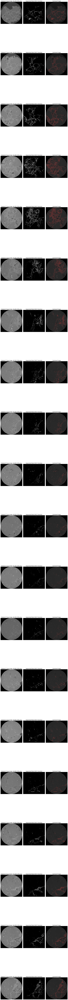

In [49]:
# Folder path
folder_path = "/Users/anna/Desktop/XCT/SlicesCropped/4A-135-crop/"

# Filenames
image_files = ["4A-150-135kv.png","4A-200-135kv.png","4A-250-135kv.png","4A-300-135kv.png","4A-350-135kv.png","4A-400-135kv.png",
               "4A-450-135kv.png","4A-500-135kv.png","4A-550-135kv.png","4A-600-135kv.png","4A-650-135kv.png","4A-700-135kv.png","4A-750-135kv.png",
               "4A-800-135kv.png","4A-850-135kv.png","4A-900-135kv.png","4A-950-135kv.png","4A-1000-135kv.png","4A-1050-135kv.png","4A-1100-135kv.png"]

#Carbonate
lower_threshold = 96
upper_threshold = 97

# Create a figure for the images and overlays
plt.figure(figsize=(12, 9 * len(image_files)))

# Loop through each image file
for i, image_file in enumerate(image_files):
    # Full path to the image
    image_path = os.path.join(folder_path, image_file)
    
    # Load the image and convert to grayscale
    ct_image = Image.open(image_path).convert("L")
    
    # Convert the image to a NumPy array
    ct_array = np.array(ct_image)
    
    # Create a mask for the segmented region
    segmented_mask = (ct_array >= lower_threshold) & (ct_array <= upper_threshold)
    
    # Create a color overlay with transparency
    overlay = np.zeros((*ct_array.shape, 3), dtype=np.uint8)  # Create an RGB image
    overlay[..., 0] = 255  # Red channel for the overlay
    overlay[~segmented_mask] = 0  # Set non-segmented areas to black
    
    # Combine original image and overlay using alpha blending
    alpha = 0.5  # Transparency level (0 = fully transparent, 1 = fully opaque)
    overlayed_image = np.dstack([ct_array] * 3)  # Convert grayscale to RGB
    overlayed_image = overlayed_image * (1 - alpha) + overlay * alpha
    
    # Plot the original, segmented, and overlayed images
    plt.subplot(len(image_files), 3, 3 * i + 1)
    plt.imshow(ct_array, cmap="gray")
    plt.title(f"Original CT Scan Image: {image_file}")
    plt.axis("off")
    
    plt.subplot(len(image_files), 3, 3 * i + 2)
    plt.imshow(segmented_mask, cmap="gray")
    plt.title(f"Segmented Mask ({lower_threshold}-{upper_threshold} Intensity)")
    plt.axis("off")
    
    plt.subplot(len(image_files), 3, 3 * i + 3)
    plt.imshow(overlayed_image.astype(np.uint8))
    plt.title(f"Overlayed Image")
    plt.axis("off")

plt.tight_layout()
#plt.savefig('1A-85-350-segmented(40-41).png')
plt.show()

In [48]:
# Folder path
folder_path = "/Users/anna/Desktop/XCT/SlicesCropped/4A-135-crop/"

# Filenames
image_files = ["4A-150-135kv.png","4A-200-135kv.png","4A-250-135kv.png","4A-300-135kv.png","4A-350-135kv.png","4A-400-135kv.png",
               "4A-450-135kv.png","4A-500-135kv.png","4A-550-135kv.png","4A-600-135kv.png","4A-650-135kv.png","4A-700-135kv.png","4A-750-135kv.png",
               "4A-800-135kv.png","4A-850-135kv.png","4A-900-135kv.png","4A-950-135kv.png","4A-1000-135kv.png","4A-1050-135kv.png","4A-1100-135kv.png"]


# Intensity threshold
lower_threshold = 96
upper_threshold = 97

total_core_pixels = 0
total_core_segmented_pixels = 0

# Loop through each image file
for image_file in image_files:
    # Full path to the image
    image_path = os.path.join(folder_path, image_file)
    
    # Load the image and convert to grayscale
    ct_image = Image.open(image_path).convert("L")
    
    # Convert the image to a NumPy array
    ct_array = np.array(ct_image)
    
    # Create a mask for the segmented region
    segmented_mask = (ct_array >= lower_threshold) & (ct_array <= upper_threshold)
    
    # Calculate percentage
    total_pixels = ct_array.size
    segmented_pixels = np.sum(segmented_mask)
    percentage = (segmented_pixels / total_pixels) * 100
    
    print(f"Image: {image_file} - Percentage of pixels in range {lower_threshold}-{upper_threshold}: {percentage:.2f}%")
    
    # Accumulate totals for entire core
    total_core_pixels += total_pixels
    total_core_segmented_pixels += segmented_pixels

# Calculate overall percentage for the entire core
if total_core_pixels > 0:
    total_core_percentage = (total_core_segmented_pixels / total_core_pixels) * 100
    print(f"Total Core - Percentage of pixels in range {lower_threshold}-{upper_threshold}: {total_core_percentage:.2f}%")

Image: 4A-150-135kv.png - Percentage of pixels in range 96-97: 2.52%
Image: 4A-200-135kv.png - Percentage of pixels in range 96-97: 2.58%
Image: 4A-250-135kv.png - Percentage of pixels in range 96-97: 4.41%
Image: 4A-300-135kv.png - Percentage of pixels in range 96-97: 6.67%
Image: 4A-350-135kv.png - Percentage of pixels in range 96-97: 7.00%
Image: 4A-400-135kv.png - Percentage of pixels in range 96-97: 4.23%
Image: 4A-450-135kv.png - Percentage of pixels in range 96-97: 2.61%
Image: 4A-500-135kv.png - Percentage of pixels in range 96-97: 1.68%
Image: 4A-550-135kv.png - Percentage of pixels in range 96-97: 1.24%
Image: 4A-600-135kv.png - Percentage of pixels in range 96-97: 0.94%
Image: 4A-650-135kv.png - Percentage of pixels in range 96-97: 0.84%
Image: 4A-700-135kv.png - Percentage of pixels in range 96-97: 0.65%
Image: 4A-750-135kv.png - Percentage of pixels in range 96-97: 0.68%
Image: 4A-800-135kv.png - Percentage of pixels in range 96-97: 0.78%
Image: 4A-850-135kv.png - Percenta

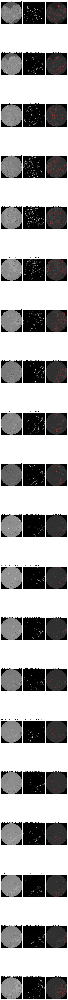

In [102]:
# Folder path
folder_path = "/Users/anna/Desktop/XCT/SlicesCropped/4A-220-crop/"

# Filenames
image_files = ["4A-150-220kv.png","4A-200-220kv.png","4A-250-220kv.png","4A-300-220kv.png","4A-350-220kv.png","4A-400-220kv.png",
               "4A-450-220kv.png","4A-500-220kv.png","4A-550-220kv.png","4A-600-220kv.png","4A-650-220kv.png","4A-700-220kv.png","4A-750-220kv.png",
               "4A-800-220kv.png","4A-850-220kv.png","4A-900-220kv.png","4A-950-220kv.png","4A-1000-220kv.png","4A-1050-220kv.png","4A-1100-220kv.png"]

#Carbonate
#lower_threshold = 109
#upper_threshold = 110

lower_threshold = 106
upper_threshold = 107

# Create a figure for the images and overlays
plt.figure(figsize=(12, 9 * len(image_files)))

# Loop through each image file
for i, image_file in enumerate(image_files):
    # Full path to the image
    image_path = os.path.join(folder_path, image_file)
    
    # Load the image and convert to grayscale
    ct_image = Image.open(image_path).convert("L")
    
    # Convert the image to a NumPy array
    ct_array = np.array(ct_image)
    
    # Create a mask for the segmented region
    segmented_mask = (ct_array >= lower_threshold) & (ct_array <= upper_threshold)
    
    # Create a color overlay with transparency
    overlay = np.zeros((*ct_array.shape, 3), dtype=np.uint8)  # Create an RGB image
    overlay[..., 0] = 255  # Red channel for the overlay
    overlay[~segmented_mask] = 0  # Set non-segmented areas to black
    
    # Combine original image and overlay using alpha blending
    alpha = 0.5  # Transparency level (0 = fully transparent, 1 = fully opaque)
    overlayed_image = np.dstack([ct_array] * 3)  # Convert grayscale to RGB
    overlayed_image = overlayed_image * (1 - alpha) + overlay * alpha
    
    # Plot the original, segmented, and overlayed images
    plt.subplot(len(image_files), 3, 3 * i + 1)
    plt.imshow(ct_array, cmap="gray")
    plt.title(f"Original CT Scan Image: {image_file}")
    plt.axis("off")
    
    plt.subplot(len(image_files), 3, 3 * i + 2)
    plt.imshow(segmented_mask, cmap="gray")
    plt.title(f"Segmented Mask ({lower_threshold}-{upper_threshold} Intensity)")
    plt.axis("off")
    
    plt.subplot(len(image_files), 3, 3 * i + 3)
    plt.imshow(overlayed_image.astype(np.uint8))
    plt.title(f"Overlayed Image")
    plt.axis("off")

plt.tight_layout()
#plt.savefig('1A-85-350-segmented(40-41).png')
plt.show()

In [3]:
# Folder path
folder_path = "/Users/anna/Desktop/X-RayCT/SlicesCropped/4A-220-crop/"

# Filenames
image_files = ["4A-150-220kv.png","4A-200-220kv.png","4A-250-220kv.png","4A-300-220kv.png","4A-350-220kv.png","4A-400-220kv.png",
               "4A-450-220kv.png","4A-500-220kv.png","4A-550-220kv.png","4A-600-220kv.png","4A-650-220kv.png","4A-700-220kv.png","4A-750-220kv.png",
               "4A-800-220kv.png","4A-850-220kv.png","4A-900-220kv.png","4A-950-220kv.png","4A-1000-220kv.png","4A-1050-220kv.png","4A-1100-220kv.png"]



# Intensity threshold

#Carbonate
#lower_threshold = 109
#upper_threshold = 110


lower_threshold = 106
upper_threshold = 107

total_core_pixels = 0
total_core_segmented_pixels = 0

# Loop through each image file
for image_file in image_files:
    # Full path to the image
    image_path = os.path.join(folder_path, image_file)
    
    # Load the image and convert to grayscale
    ct_image = Image.open(image_path).convert("L")
    
    # Convert the image to a NumPy array
    ct_array = np.array(ct_image)
    
    # Create a mask for the segmented region
    segmented_mask = (ct_array >= lower_threshold) & (ct_array <= upper_threshold)
    
    # Calculate percentage
    total_pixels = ct_array.size
    segmented_pixels = np.sum(segmented_mask)
    percentage = (segmented_pixels / total_pixels) * 100
    
    print(f"Image: {image_file} - Percentage of pixels in range {lower_threshold}-{upper_threshold}: {percentage:.2f}%")
    
    # Accumulate totals for entire core
    total_core_pixels += total_pixels
    total_core_segmented_pixels += segmented_pixels

# Calculate overall percentage for the entire core
if total_core_pixels > 0:
    total_core_percentage = (total_core_segmented_pixels / total_core_pixels) * 100
    print(f"Total Core - Percentage of pixels in range {lower_threshold}-{upper_threshold}: {total_core_percentage:.2f}%")

Image: 4A-150-220kv.png - Percentage of pixels in range 106-107: 3.18%
Image: 4A-200-220kv.png - Percentage of pixels in range 106-107: 2.65%
Image: 4A-250-220kv.png - Percentage of pixels in range 106-107: 3.85%
Image: 4A-300-220kv.png - Percentage of pixels in range 106-107: 5.55%
Image: 4A-350-220kv.png - Percentage of pixels in range 106-107: 5.31%
Image: 4A-400-220kv.png - Percentage of pixels in range 106-107: 5.16%
Image: 4A-450-220kv.png - Percentage of pixels in range 106-107: 3.42%
Image: 4A-500-220kv.png - Percentage of pixels in range 106-107: 2.93%
Image: 4A-550-220kv.png - Percentage of pixels in range 106-107: 2.45%
Image: 4A-600-220kv.png - Percentage of pixels in range 106-107: 1.85%
Image: 4A-650-220kv.png - Percentage of pixels in range 106-107: 1.55%
Image: 4A-700-220kv.png - Percentage of pixels in range 106-107: 1.10%
Image: 4A-750-220kv.png - Percentage of pixels in range 106-107: 1.27%
Image: 4A-800-220kv.png - Percentage of pixels in range 106-107: 1.33%
Image:

In [4]:
# Folder path
folder_path = "/Users/anna/Desktop/X-RayCT/SlicesCropped/4A-220-crop/"

# Filenames
image_files = ["4A-150-220kv.png","4A-200-220kv.png","4A-250-220kv.png","4A-300-220kv.png","4A-350-220kv.png","4A-400-220kv.png",
               "4A-450-220kv.png","4A-500-220kv.png","4A-550-220kv.png","4A-600-220kv.png","4A-650-220kv.png","4A-700-220kv.png","4A-750-220kv.png",
               "4A-800-220kv.png","4A-850-220kv.png","4A-900-220kv.png","4A-950-220kv.png","4A-1000-220kv.png","4A-1050-220kv.png","4A-1100-220kv.png"]



# Intensity threshold

#Carbonate
#lower_threshold = 109
#upper_threshold = 110


lower_threshold = 106
upper_threshold = 107

total_core_pixels = 0
total_core_segmented_pixels = 0

# Loop through each image file
for image_file in image_files:
    # Full path to the image
    image_path = os.path.join(folder_path, image_file)
    
    # Load the image and convert to grayscale
    ct_image = Image.open(image_path).convert("L")
    
    # Convert the image to a NumPy array
    ct_array = np.array(ct_image)
    
    # Exclude black pixels (0) from total pixel count
    valid_pixels_mask = ct_array > 0
    total_valid_pixels = np.sum(valid_pixels_mask)
    
    # Create a mask for the segmented region within the valid pixels
    segmented_mask = (ct_array >= lower_threshold) & (ct_array <= upper_threshold) & valid_pixels_mask
    
    # Calculate percentage excluding black pixels
    segmented_pixels = np.sum(segmented_mask)
    percentage = (segmented_pixels / total_valid_pixels) * 100 if total_valid_pixels > 0 else 0
    
    print(f"Image: {image_file} - Percentage of pixels in range {lower_threshold}-{upper_threshold} (excluding black): {percentage:.2f}%")
    
    # Accumulate totals for entire core
    total_core_pixels += total_valid_pixels
    total_core_segmented_pixels += segmented_pixels

# Calculate overall percentage for the entire core
if total_core_pixels > 0:
    total_core_percentage = (total_core_segmented_pixels / total_core_pixels) * 100
    print(f"Total Core - Percentage of pixels in range {lower_threshold}-{upper_threshold} (excluding black): {total_core_percentage:.2f}%")

Image: 4A-150-220kv.png - Percentage of pixels in range 106-107 (excluding black): 4.04%
Image: 4A-200-220kv.png - Percentage of pixels in range 106-107 (excluding black): 3.36%
Image: 4A-250-220kv.png - Percentage of pixels in range 106-107 (excluding black): 4.89%
Image: 4A-300-220kv.png - Percentage of pixels in range 106-107 (excluding black): 7.05%
Image: 4A-350-220kv.png - Percentage of pixels in range 106-107 (excluding black): 6.73%
Image: 4A-400-220kv.png - Percentage of pixels in range 106-107 (excluding black): 6.55%
Image: 4A-450-220kv.png - Percentage of pixels in range 106-107 (excluding black): 4.34%
Image: 4A-500-220kv.png - Percentage of pixels in range 106-107 (excluding black): 3.71%
Image: 4A-550-220kv.png - Percentage of pixels in range 106-107 (excluding black): 3.12%
Image: 4A-600-220kv.png - Percentage of pixels in range 106-107 (excluding black): 2.35%
Image: 4A-650-220kv.png - Percentage of pixels in range 106-107 (excluding black): 1.97%
Image: 4A-700-220kv.p